In [1]:
# Manipulation and Visualasation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff
# Libraries for Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, LabelEncoder,OneHotEncoder
from sklearn.model_selection import cross_val_score,GridSearchCV
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score, f1_score, precision_score, recall_score,roc_curve, roc_auc_score
from imblearn.combine import SMOTEENN


# Models
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
# ignore warning
import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv('C:/Users/FREDA/Downloads/archive/diabetes.csv')
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [3]:
# Displaying the shape of the dataset
print(f"The dataset has {data.shape[0]} rows and {data.shape[1]} columns.")

# Displaying column names
print("Column names:")
print(data.columns.tolist())

# Displaying data types of each column
print("\nData types of each column:")
print(data.dtypes)

# Displaying basic statistics for numerical columns
print("\nBasic statistics for numerical columns:")
print(data.describe())

The dataset has 768 rows and 9 columns.
Column names:
['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome']

Data types of each column:
Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

Basic statistics for numerical columns:
       Pregnancies     Glucose  BloodPressure  SkinThickness     Insulin  \
count   768.000000  768.000000     768.000000     768.000000  768.000000   
mean      3.845052  120.894531      69.105469      20.536458   79.799479   
std       3.369578   31.972618      19.355807      15.952218  115.244002   
min       0.000000    0.000000       0.000000       0.000000    0.000000   
25%       1.000000   99.000000    

In [4]:
### Info of Dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [5]:
import matplotlib.pyplot as plt
import numpy as np

def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow, save_as=None, title="Column Distribution", xlabel="Values", ylabel="Counts", color='blue'):
    # Filter columns based on unique values
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]]
    
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) // nGraphPerRow  # Use integer division
    
    plt.figure(num=None, figsize=(6 * nGraphPerRow, 8 * nGraphRow), dpi=80, facecolor='w', edgecolor='k')
    
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        
        # Check for missing values
        if columnDf.isnull().any():
            print(f"Warning: Column '{columnNames[i]}' contains missing values. They will be ignored in the plot.")
            columnDf = columnDf.dropna()
        
        # Plotting
        if not np.issubdtype(columnDf.dtype, np.number):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar(color=color)
        else:
            columnDf.hist(color=color)
        
        plt.ylabel(ylabel)
        plt.xlabel(xlabel)
        plt.xticks(rotation=90)
        plt.title(f'{columnNames[i]} (column {i})')
        plt.grid(axis='y')  # Add gridlines for better readability
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout(pad=1.0, w_pad=1.0, h_pad=1.0)
    
    # Save the figure if a filename is provided
    if save_as:
        plt.savefig(save_as)
        print(f"Figure saved as '{save_as}'")
    
    plt.show()

In [6]:
### Descriptive Analysis
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


In [7]:
### Missing Values
data.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [8]:
### Duplicated Values
data[data.duplicated()]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome


In [9]:
### Pregnancies Distrbution
data.Pregnancies.value_counts().to_frame()

,count
Pregnancies,
1,135
0,111
2,103
3,75
4,68
5,57
6,50
7,45
8,38


In [10]:
### Pregnancies VS Outcome
data.groupby(['Outcome','Pregnancies'])['Pregnancies'].count()

Outcome  Pregnancies
0        0               73
         1              106
         2               84
         3               48
         4               45
         5               36
         6               34
         7               20
         8               16
         9               10
         10              14
         11               4
         12               5
         13               5
1        0               38
         1               29
         2               19
         3               27
         4               23
         5               21
         6               16
         7               25
         8               22
         9               18
         10              10
         11               7
         12               4
         13               5
         14               2
         15               1
         17               1
Name: Pregnancies, dtype: int64

In [11]:
data['Glucose'].value_counts()

Glucose
99     17
100    17
111    14
129    14
125    14
       ..
191     1
177     1
44      1
62      1
190     1
Name: count, Length: 136, dtype: int64

In [12]:
data.groupby(['Outcome','Glucose'])['Glucose'].count()

Outcome  Glucose
0        0          3
         44         1
         56         1
         57         2
         61         1
                   ..
1        195        2
         196        3
         197        3
         198        1
         199        1
Name: Glucose, Length: 215, dtype: int64

In [13]:
data['BloodPressure'].value_counts()

BloodPressure
70     57
74     52
78     45
68     45
72     44
64     43
80     40
76     39
60     37
0      35
62     34
66     30
82     30
88     25
84     23
90     22
86     21
58     21
50     13
56     12
52     11
54     11
75      8
92      8
65      7
85      6
94      6
48      5
96      4
44      4
100     3
106     3
98      3
110     3
55      2
108     2
104     2
46      2
30      2
122     1
95      1
102     1
61      1
24      1
38      1
40      1
114     1
Name: count, dtype: int64

In [14]:
data.groupby(['Outcome','BloodPressure'])['BloodPressure'].count()

Outcome  BloodPressure
0        0                19
         24                1
         30                1
         38                1
         44                4
                          ..
1        104               2
         106               1
         108               1
         110               2
         114               1
Name: BloodPressure, Length: 82, dtype: int64

In [15]:
data['SkinThickness'].value_counts()

SkinThickness
0     227
32     31
30     27
27     23
23     22
33     20
28     20
18     20
31     19
19     18
39     18
29     17
40     16
25     16
26     16
22     16
37     16
41     15
35     15
36     14
15     14
17     14
20     13
24     12
42     11
13     11
21     10
46      8
34      8
12      7
38      7
11      6
43      6
16      6
45      6
14      6
44      5
10      5
48      4
47      4
49      3
50      3
8       2
7       2
52      2
54      2
63      1
60      1
56      1
51      1
99      1
Name: count, dtype: int64

In [16]:
data.groupby(['Outcome','SkinThickness'])['SkinThickness'].count()

Outcome  SkinThickness
0        0                139
         7                  1
         8                  2
         10                 5
         11                 6
                         ... 
1        49                 3
         51                 1
         56                 1
         63                 1
         99                 1
Name: SkinThickness, Length: 89, dtype: int64

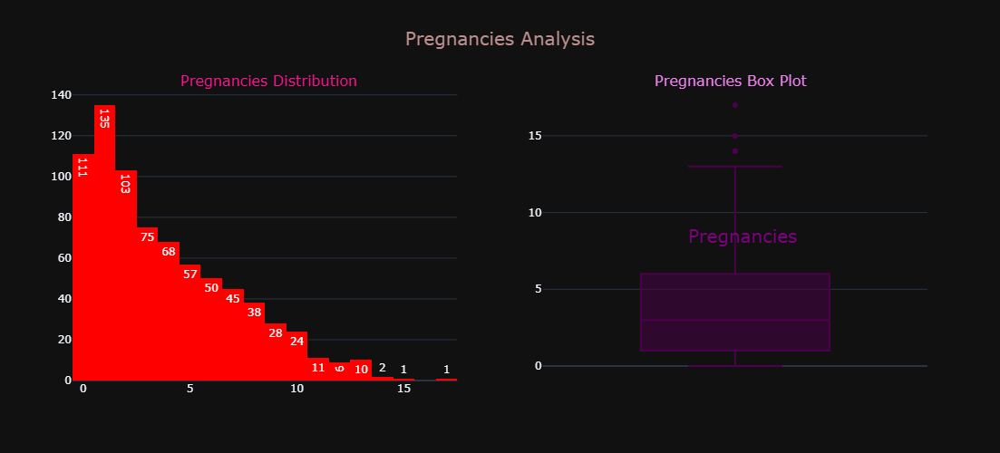

In [17]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='Pregnancies', color_discrete_sequence=px.colors.sequential.Bluered_r,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='Pregnancies',color_discrete_sequence=px.colors.sequential.BuPu_r).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="Pregnancies Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='rosybrown'),
    template="plotly_dark",
    width=1000, 
    height=500
)
fig.add_annotation(text="Pregnancies Distribution",
                   font=dict(size=16, color='deeppink'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="Pregnancies Box Plot",
                   font=dict(size=16, color='violet'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="Pregnancies",
    showarrow=False,
    font=dict(size=20, color="purple"),
    xref="paper", yref="paper",
    x=.85, y=0.5
)
fig.show()

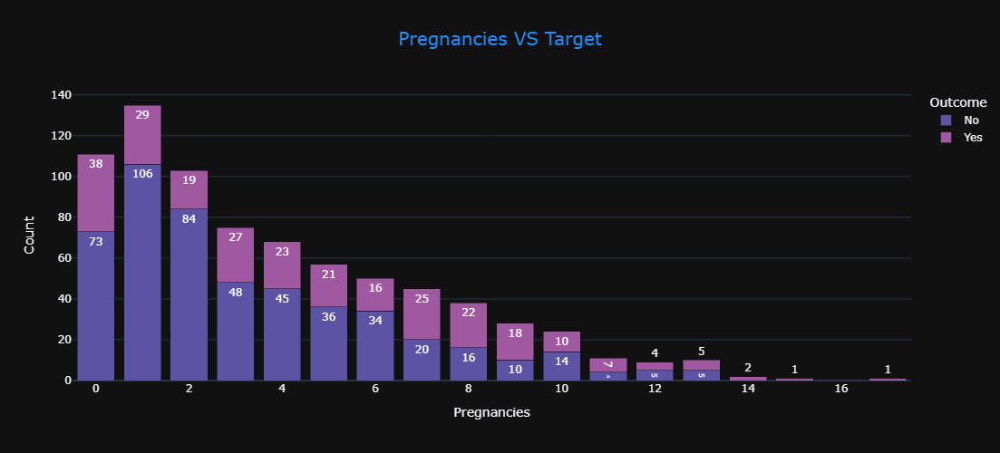

In [18]:
pregnancies_summary = data.groupby(['Pregnancies', 'Outcome']).size().reset_index(name='Count')
pregnancies_summary['Outcome'] = pregnancies_summary['Outcome'].replace(0, 'No').replace(1, 'Yes')
fig = px.bar(pregnancies_summary, 
             x='Pregnancies', 
             y='Count', 
             color='Outcome', 
             title='Pregnancies VS Target',
             text='Count',
             color_discrete_sequence=px.colors.sequential.Sunset_r)
fig.update_layout(
    title_x=0.5,
    title_font=dict(size=20, color='dodgerblue'), 
    template='plotly_dark',
    barmode='stack',  
    xaxis_title='Pregnancies',
    yaxis_title='Count',
    width=500,
    height=500,
    showlegend=True,
)
fig.show()

In [19]:
### Glucose Distrbution
min_glucose = data['Glucose'].min()
max_glucose = data['Glucose'].max()
# Print the results
print(f"Minimum Glucose: {min_glucose}")
print(f"Maximum Glucose: {max_glucose}")

Minimum Glucose: 0
Maximum Glucose: 199


In [20]:
### Average Glucose VS Traget
pivot = pd.pivot_table(data, values="Glucose", index="Outcome", aggfunc='mean')
pivot

,Glucose
Outcome,
0,109.980000
1,141.257463


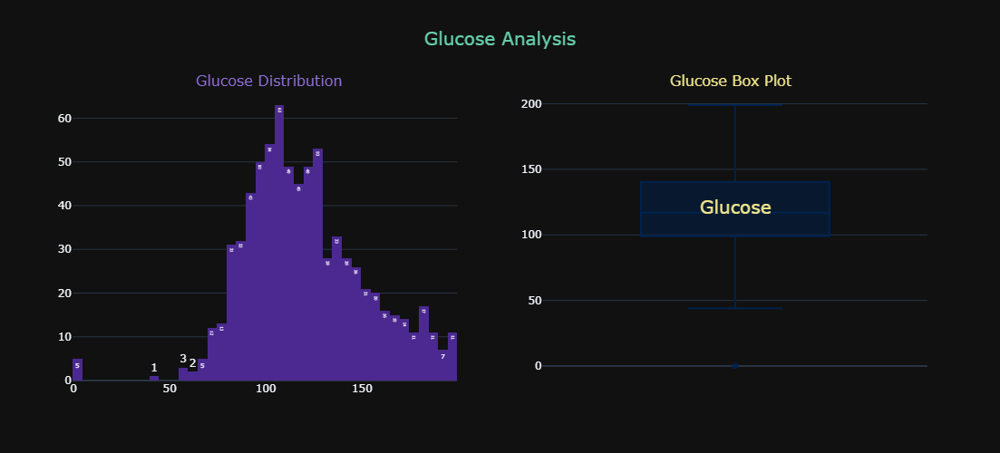

In [21]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='Glucose', color_discrete_sequence=px.colors.sequential.Agsunset,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='Glucose',color_discrete_sequence=px.colors.sequential.Cividis).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="Glucose Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='mediumaquamarine'),
    template="plotly_dark",
    width=1000, 
    height=500
)
fig.add_annotation(text="Glucose Distribution",
                   font=dict(size=16, color='mediumpurple'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="Glucose Box Plot",
                   font=dict(size=16, color='khaki'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="Glucose",
    showarrow=False,
    font=dict(size=20, color="khaki"),
    xref="paper", yref="paper",
    x=.82, y=0.6
)
fig.show()

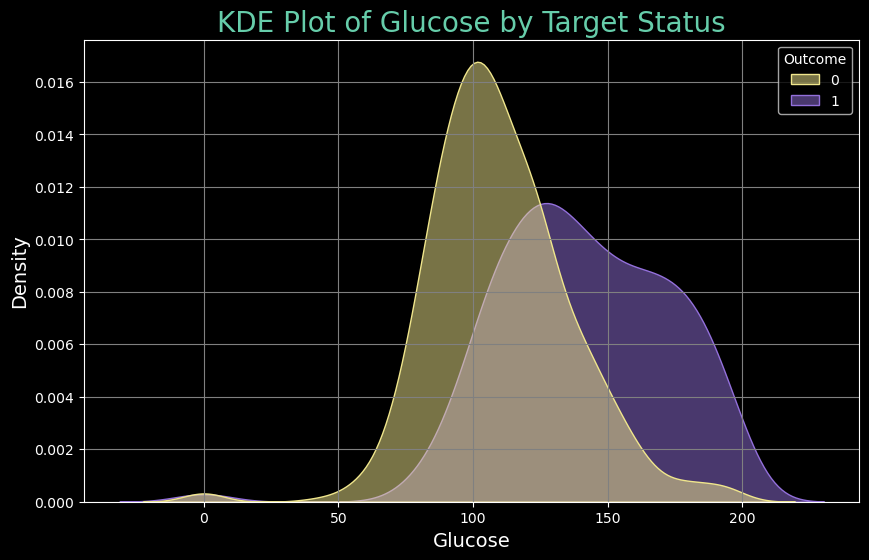

In [22]:
plt.style.use('dark_background')
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data, x='Glucose', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'mediumpurple', 0: 'khaki'},
             alpha=0.5)
plt.title('KDE Plot of Glucose by Target Status', fontsize=20, color='mediumaquamarine')
plt.xlabel('Glucose', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()

In [23]:
### BloodPressure Distrbution
min_blood = data['BloodPressure'].min()
max_blood = data['BloodPressure'].max()
# Print the results
print(f"Minimum BloodPressure: {min_blood}")
print(f"Maximum BloodPressure: {max_blood}")

Minimum BloodPressure: 0
Maximum BloodPressure: 122


In [24]:
### Average BloodPressure VS Traget
pivot = pd.pivot_table(data, values="BloodPressure", index="Outcome", aggfunc='mean')
pivot

,BloodPressure
Outcome,
0,68.184000
1,70.824627


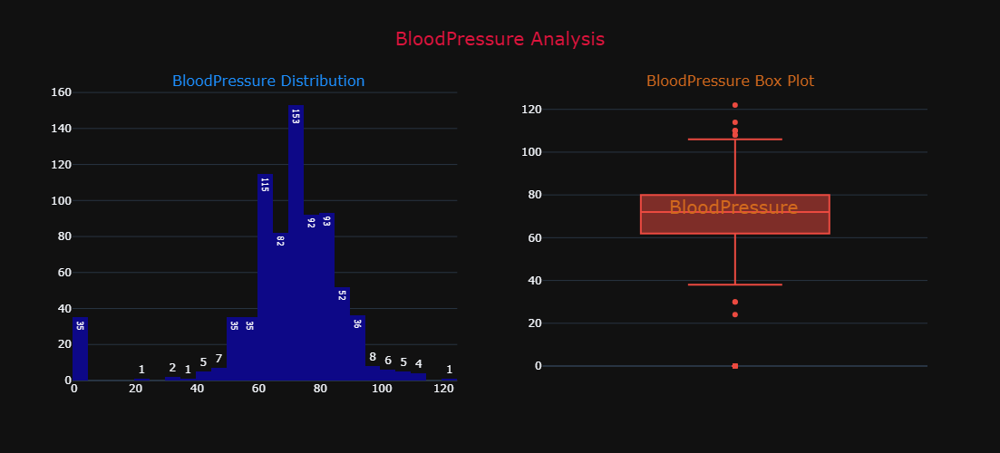

In [25]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='BloodPressure', color_discrete_sequence=px.colors.sequential.Plasma,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='BloodPressure',color_discrete_sequence=px.colors.sequential.Peach_r).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="BloodPressure Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='crimson'),
    template="plotly_dark",
    width=1000, 
    height=500
)
fig.add_annotation(text="BloodPressure Distribution",
                   font=dict(size=16, color='dodgerblue'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="BloodPressure Box Plot",
                   font=dict(size=16, color='chocolate'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="BloodPressure",
    showarrow=False,
    font=dict(size=20, color="chocolate"),
    xref="paper", yref="paper",
    x=.85, y=0.6
)
fig.show()

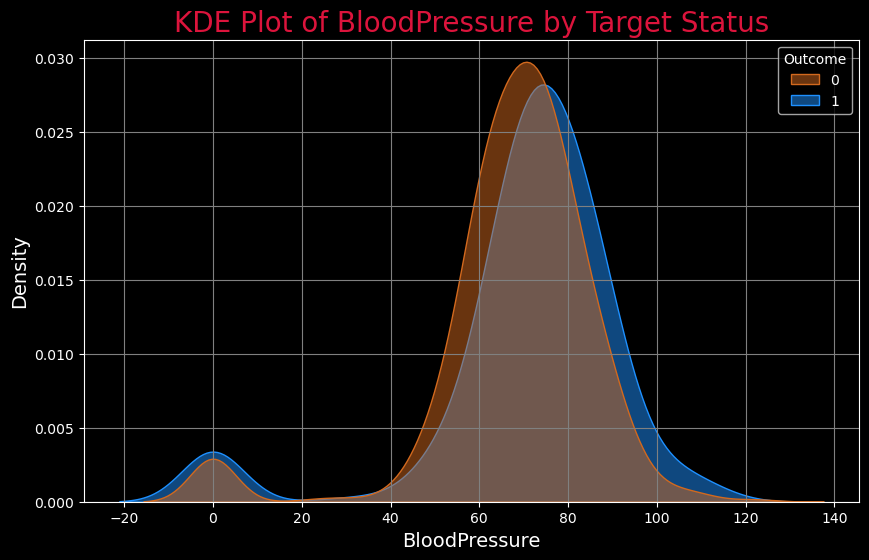

In [26]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data, x='BloodPressure', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'dodgerblue', 0: 'chocolate'},
             alpha=0.5)
plt.title('KDE Plot of BloodPressure by Target Status', fontsize=20, color='crimson')
plt.xlabel('BloodPressure', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()

In [27]:
### SkinThickness Distrbution
min_skin = data['SkinThickness'].min()
max_skin = data['SkinThickness'].max()
# Print the results
print(f"Minimum SkinThickness: {min_skin}")
print(f"Maximum SkinThickness: {max_skin}")

Minimum SkinThickness: 0
Maximum SkinThickness: 99


In [28]:
### Average SkinThickness VS Traget
pivot = pd.pivot_table(data, values="SkinThickness", index="Outcome", aggfunc='mean')
pivot

,SkinThickness
Outcome,
0,19.664000
1,22.164179


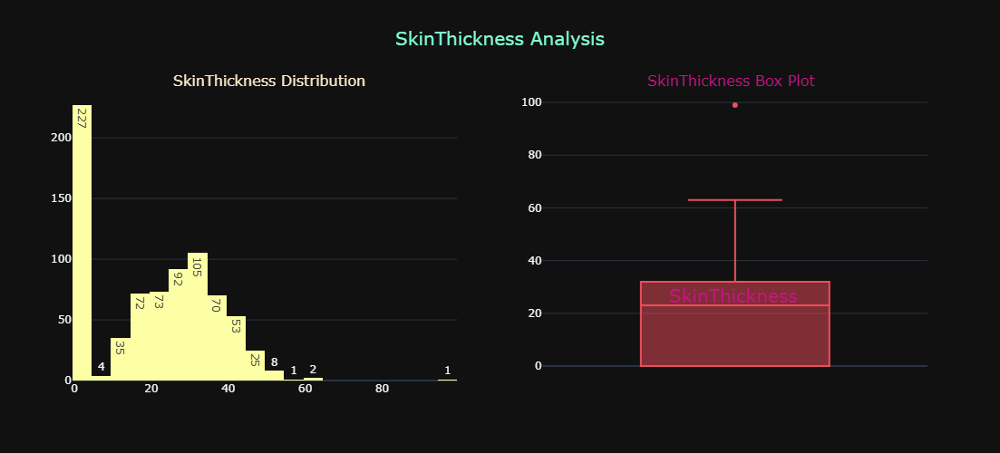

In [29]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='SkinThickness', color_discrete_sequence=px.colors.sequential.Inferno_r,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='SkinThickness',color_discrete_sequence=px.colors.sequential.Oryel_r).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="SkinThickness Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='aquamarine'),
    template="plotly_dark",
    width=1000, 
    height=500
)
fig.add_annotation(text="SkinThickness Distribution",
                   font=dict(size=16, color='blanchedalmond'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="SkinThickness Box Plot",
                   font=dict(size=16, color='mediumvioletred'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="SkinThickness",
    showarrow=False,
    font=dict(size=20, color="mediumvioletred"),
    xref="paper", yref="paper",
    x=.85, y=0.25
)
fig.show()

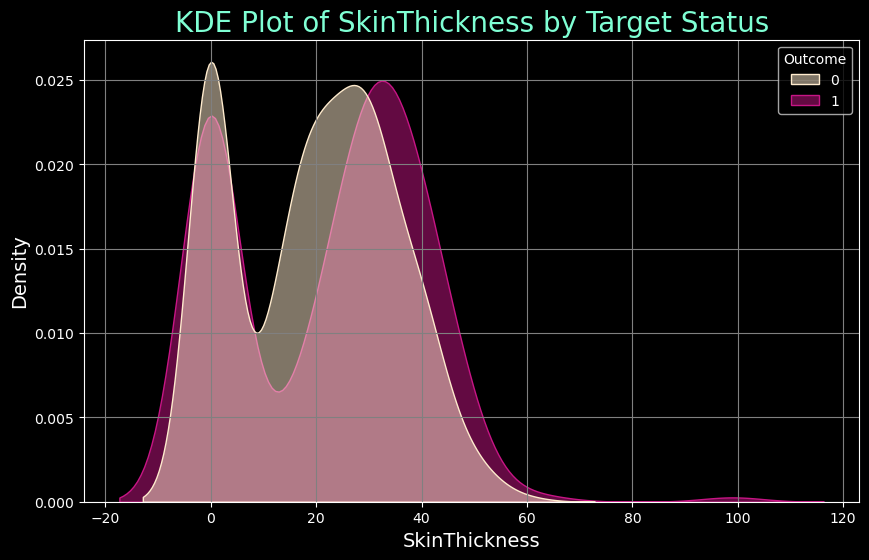

In [30]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data, x='SkinThickness', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'mediumvioletred', 0: 'blanchedalmond'},
             alpha=0.5)
plt.title('KDE Plot of SkinThickness by Target Status', fontsize=20, color='aquamarine')
plt.xlabel('SkinThickness', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()

In [31]:
### Insulin Distrbution
min_insulin = data['Insulin'].min()
max_insulin = data['Insulin'].max()
# Print the results
print(f"Minimum Insulin: {min_insulin}")
print(f"Maximum Insulin: {max_insulin}")

Minimum Insulin: 0
Maximum Insulin: 846


In [32]:
### Average Insulin VS Traget
pivot = pd.pivot_table(data, values="Insulin", index="Outcome", aggfunc='mean')
pivot

,Insulin
Outcome,
0,68.792000
1,100.335821


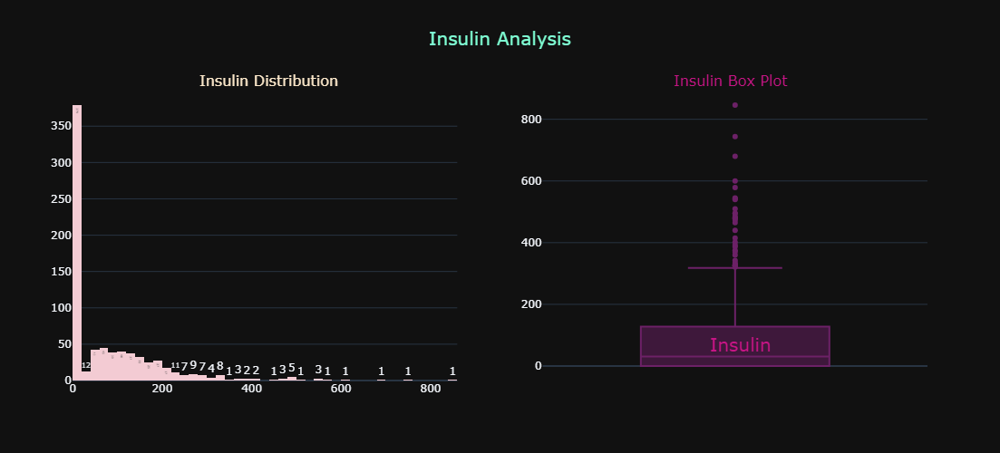

In [33]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='Insulin', color_discrete_sequence=px.colors.sequential.Magenta,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='Insulin',color_discrete_sequence=px.colors.sequential.Magenta_r).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="Insulin Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='aquamarine'),
    template="plotly_dark",
    width=1000, 
    height=500
)
fig.add_annotation(text="Insulin Distribution",
                   font=dict(size=16, color='blanchedalmond'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="Insulin Box Plot",
                   font=dict(size=16, color='mediumvioletred'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="Insulin",
    showarrow=False,
    font=dict(size=20, color="mediumvioletred"),
    xref="paper", yref="paper",
    x=.82, y=0.08
)
fig.show()

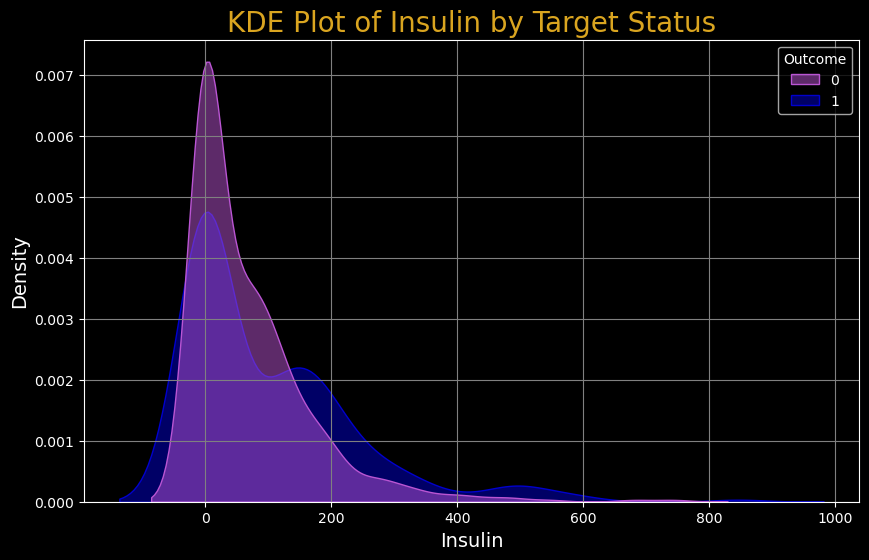

In [34]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data, x='Insulin', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'mediumblue', 0: 'mediumorchid'},
             alpha=0.5)
plt.title('KDE Plot of Insulin by Target Status', fontsize=20, color='goldenrod')
plt.xlabel('Insulin', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()

In [35]:
### BMI Distrbution
min_bmi = data['BMI'].min()
max_bmi = data['BMI'].max()
# Print the results
print(f"Minimum BMI: {min_bmi}")
print(f"Maximum BMI: {max_bmi}")

Minimum BMI: 0.0
Maximum BMI: 67.1


In [36]:
### Average BMI VS Traget
pivot = pd.pivot_table(data, values="BMI", index="Outcome", aggfunc='mean')
pivot

,BMI
Outcome,
0,30.304200
1,35.142537


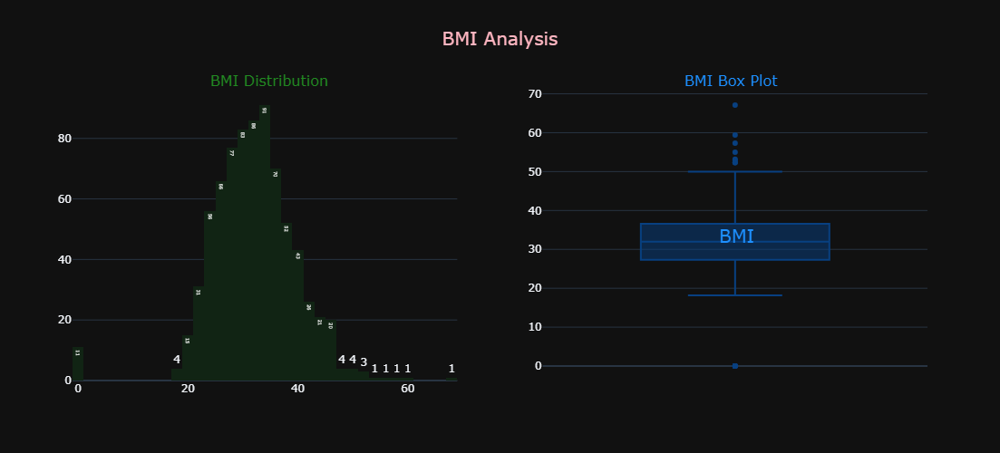

In [37]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='BMI', color_discrete_sequence=px.colors.sequential.algae_r,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='BMI',color_discrete_sequence=px.colors.sequential.GnBu_r).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="BMI Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='lightpink'),
    template="plotly_dark",
    width=1000, 
    height=500
)
fig.add_annotation(text="BMI Distribution",
                   font=dict(size=16, color='forestgreen'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="BMI Box Plot",
                   font=dict(size=16, color='dodgerblue'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="BMI",
    showarrow=False,
    font=dict(size=20, color="dodgerblue"),
    xref="paper", yref="paper",
    x=.8, y=0.5
)
fig.show()

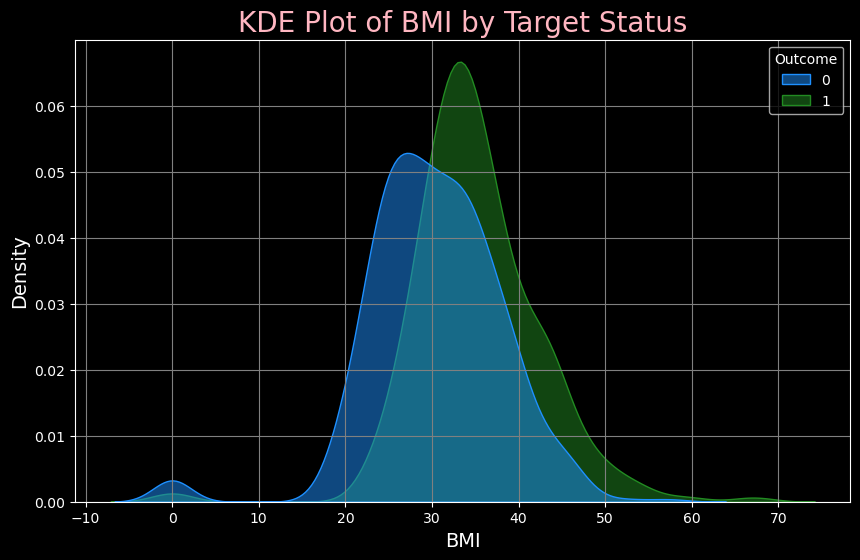

In [38]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data,x='BMI', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'forestgreen', 0: 'dodgerblue'},
             alpha=0.5)
plt.title('KDE Plot of BMI by Target Status', fontsize=20, color='lightpink')
plt.xlabel('BMI', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()

In [39]:
bins = [0, 18.5, 25, 30, 35, np.inf]
names = ['Underweight', 'Normal weight', 'Overweight', 'Obese', 'Extremly Obese']
data['SegmentBMI'] = pd.cut(data['BMI'],bins, labels=names)
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,SegmentBMI
0,6,148,72,35,0,33.6,0.627,50,1,Obese
1,1,85,66,29,0,26.6,0.351,31,0,Overweight
2,8,183,64,0,0,23.3,0.672,32,1,Normal weight
3,1,89,66,23,94,28.1,0.167,21,0,Overweight
4,0,137,40,35,168,43.1,2.288,33,1,Extremly Obese


In [40]:
data.SegmentBMI.value_counts().to_frame()

,count
SegmentBMI,
Extremly Obese,244
Obese,221
Overweight,180
Normal weight,108
Underweight,4


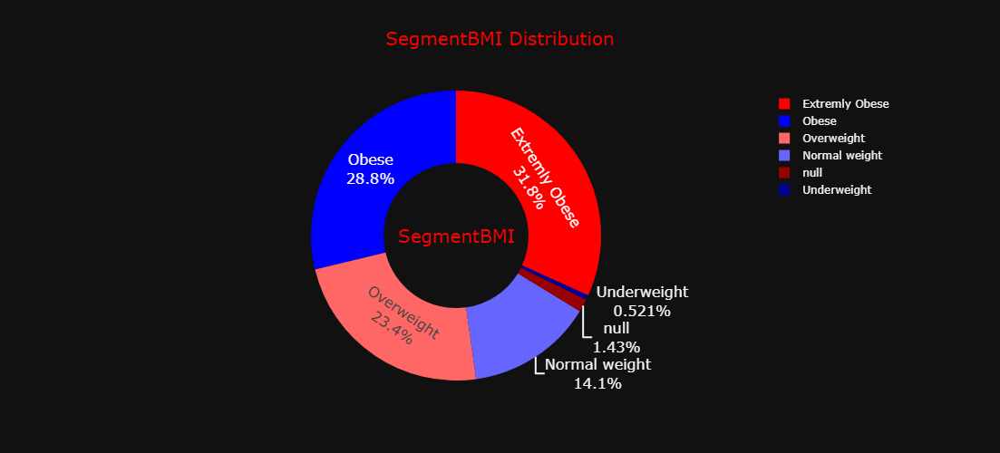

In [41]:
fig = px.pie(data, title="SegmentBMI Distribution",names="SegmentBMI", color_discrete_sequence=px.colors.sequential.Bluered_r)
fig.update_traces(hole=.5, hoverinfo="label+percent+name",textinfo='percent+label', textfont_size=16)
fig.update_layout(
    title_x=0.5,
    title_font=dict(size=20, color='red'),
    template="plotly_dark",  
    width=700,              
    height=500 
)
fig.add_annotation(
    text="SegmentBMI",
    showarrow=False,
    font=dict(size=20, color="red"), 
    xref="paper", yref="paper",
    x=0.5, y=0.5 
)
fig.show()

In [42]:
### DiabetesPedigreeFunction Distrbution
min_pedigree = data['DiabetesPedigreeFunction'].min()
max_pedigree = data['DiabetesPedigreeFunction'].max()
# Print the results
print(f"Minimum DiabetesPedigreeFunction: {min_pedigree}")
print(f"Maximum DiabetesPedigreeFunction: {max_pedigree}")

Minimum DiabetesPedigreeFunction: 0.078
Maximum DiabetesPedigreeFunction: 2.42


In [43]:
### Average DiabetesPedigreeFunction VS Traget
pivot = pd.pivot_table(data, values="DiabetesPedigreeFunction", index="Outcome", aggfunc='mean')
pivot

,DiabetesPedigreeFunction
Outcome,
0,0.429734
1,0.550500


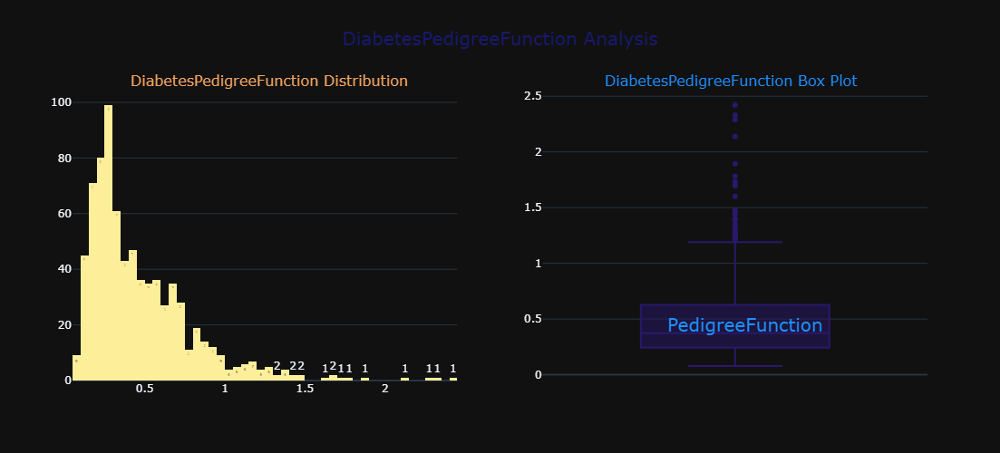

In [44]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='DiabetesPedigreeFunction', color_discrete_sequence=px.colors.sequential.haline_r,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='DiabetesPedigreeFunction',color_discrete_sequence=px.colors.sequential.haline).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="DiabetesPedigreeFunction Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='midnightblue'),
    template="plotly_dark",
    width=1000, 
    height=500
)
fig.add_annotation(text="DiabetesPedigreeFunction Distribution",
                   font=dict(size=16, color='sandybrown'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="DiabetesPedigreeFunction Box Plot",
                   font=dict(size=16, color='dodgerblue'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="PedigreeFunction",
    showarrow=False,
    font=dict(size=20, color="dodgerblue"),
    xref="paper", yref="paper",
    x=.88, y=0.15
)
fig.show()

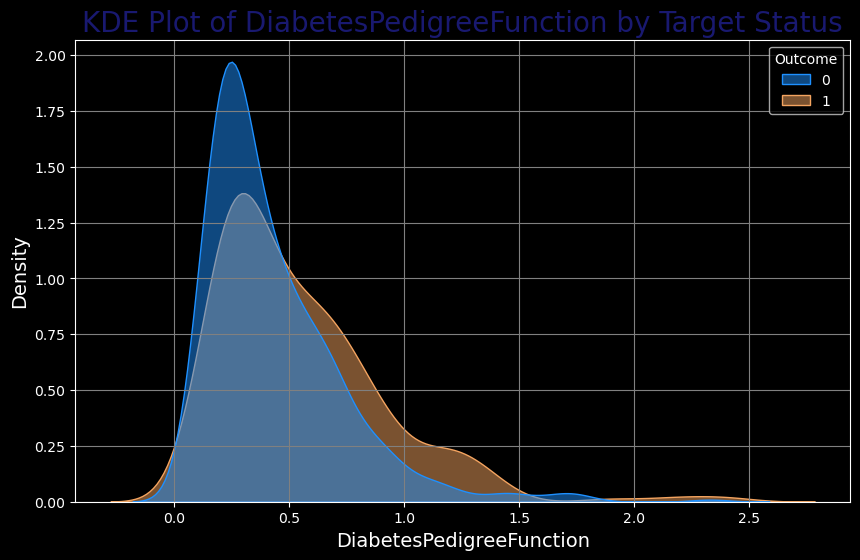

In [45]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data,x='DiabetesPedigreeFunction', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'sandybrown', 0: 'dodgerblue'},
             alpha=0.5)
plt.title('KDE Plot of DiabetesPedigreeFunction by Target Status', fontsize=20, color='midnightblue')
plt.xlabel('DiabetesPedigreeFunction', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()

In [46]:
### Age Distrbution
min_age = data['Age'].min()
max_age = data['Age'].max()
# Print the results
print(f"Minimum Age: {min_age}")
print(f"Maximum Age: {max_age}")

Minimum Age: 21
Maximum Age: 81


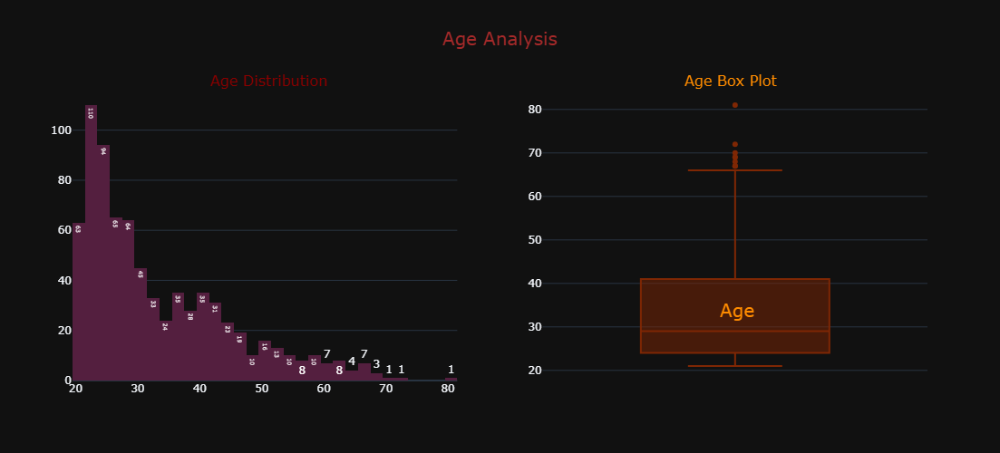

In [47]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='Age', color_discrete_sequence=px.colors.sequential.Brwnyl_r,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='Age',color_discrete_sequence=px.colors.sequential.Oranges_r).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="Age Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='brown'),
    template="plotly_dark",
    width=1000, 
    height=500
)
fig.add_annotation(text="Age Distribution",
                   font=dict(size=16, color='darkred'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="Age Box Plot",
                   font=dict(size=16, color='darkorange'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="Age",
    showarrow=False,
    font=dict(size=20, color="darkorange"),
    xref="paper", yref="paper",
    x=.8, y=0.2
)
fig.show()

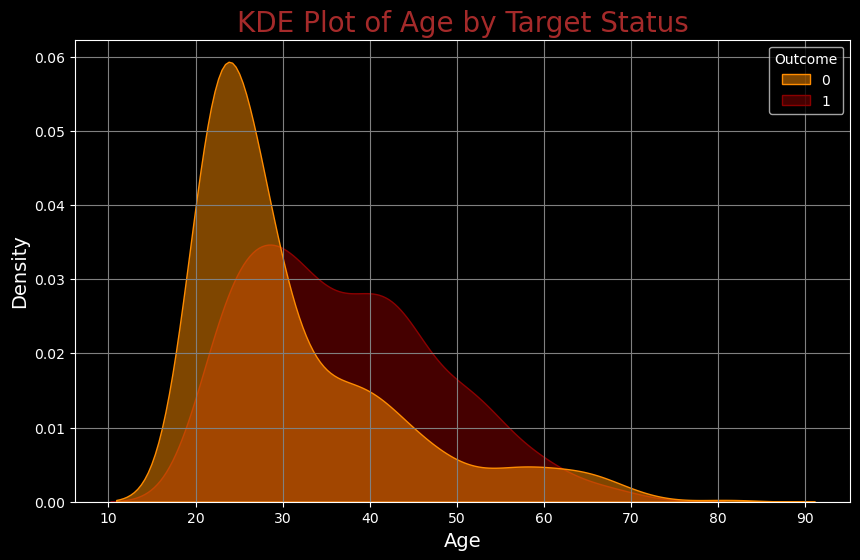

In [48]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data,x='Age', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'darkred', 0: 'darkorange'},
             alpha=0.5)
plt.title('KDE Plot of Age by Target Status', fontsize=20, color='brown')
plt.xlabel('Age', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()

In [49]:
### Target Distrbution
data.Outcome.value_counts().to_frame()

,count
Outcome,
0,500
1,268


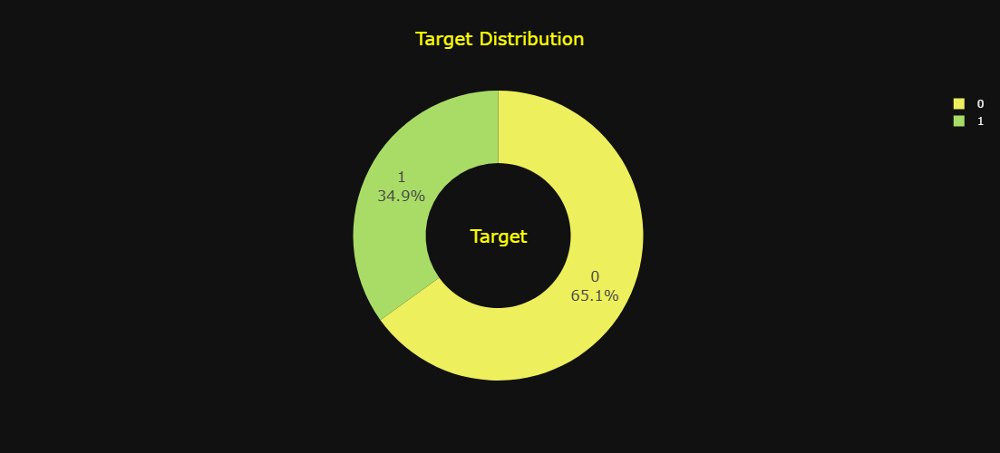

In [50]:
fig = px.pie(data, title="Target Distribution",names="Outcome", color_discrete_sequence=px.colors.sequential.Aggrnyl_r)
fig.update_traces(hole=.5, hoverinfo="label+percent+name",textinfo='percent+label', textfont_size=16)
fig.update_layout(
    title_x=0.5,
    title_font=dict(size=20, color='yellow'),
    template="plotly_dark",  
    width=700,              
    height=500 
)
fig.add_annotation(
    text="Target",
    showarrow=False,
    font=dict(size=20, color="yellow"), 
    xref="paper", yref="paper",
    x=0.5, y=0.5 
)
fig.show()

In [51]:
columns = data.select_dtypes(include='number').columns
columns = columns[:-1]
columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

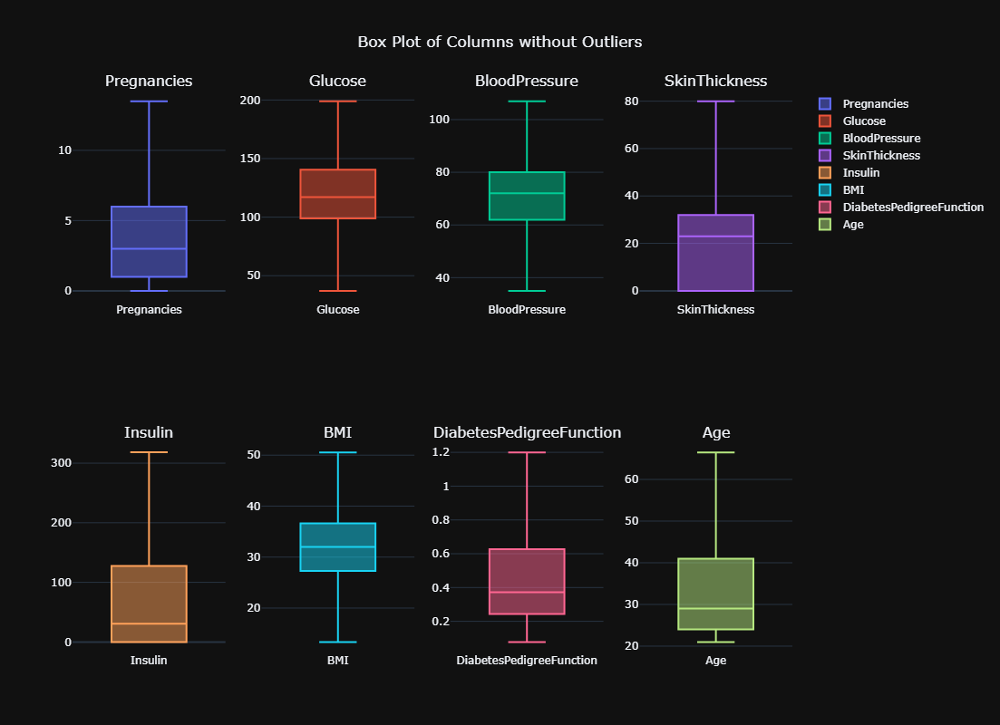

In [52]:
fig = make_subplots(rows=2, cols=4, subplot_titles=columns)
for i, col in enumerate(columns, start=1):
    q1 = data[col].quantile(0.25)
    q3 = data[col].quantile(0.75)
    iqr = q3 - q1
    upper = q3 + (1.5 * iqr)
    lower = q1 - (1.5 * iqr)
    data[col][data[col] > upper] = upper
    data[col][data[col] < lower] = lower
    trace = go.Box(y=data[col], name=col)
    row = (i - 1) // 4 + 1
    col = (i - 1) % 4 + 1
    fig.add_trace(trace, row=row, col=col)
fig.update_layout(title_text='Box Plot of Columns without Outliers',
                  title_x=0.5, title_y=0.95, height=800, width=1000, template='plotly_dark')
fig.show()

In [53]:
columns = data.select_dtypes(include=['category','object']).columns
columns

Index(['SegmentBMI'], dtype='object')

In [54]:
### Transform Object Columns into Numbers
label_encoder = LabelEncoder()
for col in columns:
    data[col] = label_encoder.fit_transform(data[col])
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,SegmentBMI
0,6.0,148.0,72,35,0.0,33.6,0.627,50.0,1,2
1,1.0,85.0,66,29,0.0,26.6,0.351,31.0,0,3
2,8.0,183.0,64,0,0.0,23.3,0.672,32.0,1,1
3,1.0,89.0,66,23,94.0,28.1,0.167,21.0,0,3
4,0.0,137.0,40,35,168.0,43.1,1.200,33.0,1,0


In [55]:
### Show Correlation
corr = data.corr()
corr

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,SegmentBMI
Pregnancies,1.000000,0.128987,0.184307,-0.084349,-0.077793,0.024681,-0.017398,0.549695,0.220392,0.008419
Glucose,0.128987,1.000000,0.197865,0.059806,0.315856,0.235542,0.120213,0.269056,0.479158,-0.105842
BloodPressure,0.184307,0.197865,1.000000,0.152644,0.050080,0.282544,0.038793,0.304208,0.113301,-0.202628
SkinThickness,-0.084349,0.059806,0.152644,1.000000,0.488101,0.401494,0.177920,-0.119170,0.073125,-0.263598
Insulin,-0.077793,0.315856,0.050080,0.488101,1.000000,0.209665,0.190087,-0.065547,0.124721,-0.147771
BMI,0.024681,0.235542,0.282544,0.401494,0.209665,1.000000,0.141087,0.043375,0.309739,-0.655377
DiabetesPedigreeFunction,-0.017398,0.120213,0.038793,0.177920,0.190087,0.141087,1.000000,0.047289,0.184969,-0.072473
Age,0.549695,0.269056,0.304208,-0.119170,-0.065547,0.043375,0.047289,1.000000,0.242702,-0.024697
Outcome,0.220392,0.479158,0.113301,0.073125,0.124721,0.309739,0.184969,0.242702,1.000000,-0.122902
SegmentBMI,0.008419,-0.105842,-0.202628,-0.263598,-0.147771,-0.655377,-0.072473,-0.024697,-0.122902,1.000000


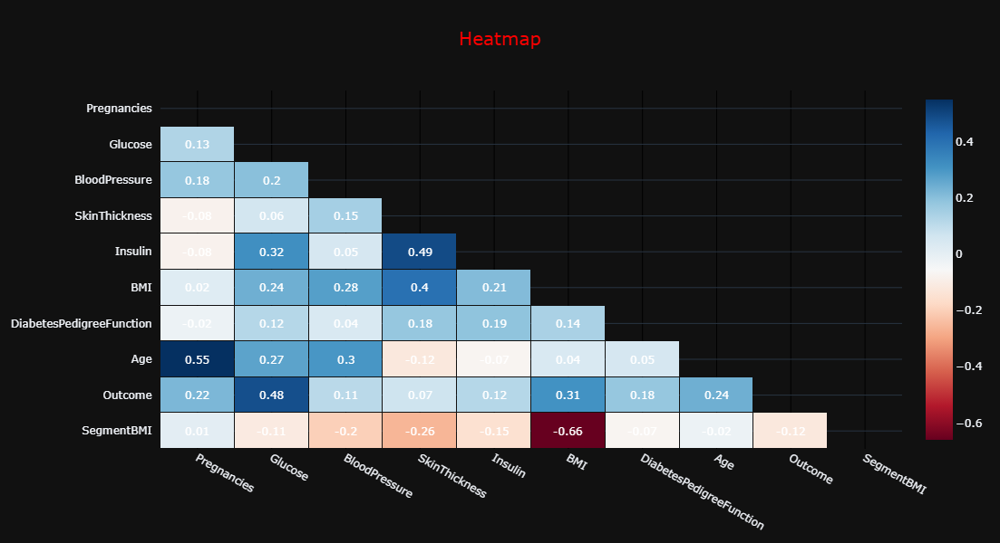

In [56]:
mask = np.triu(np.ones_like(corr, dtype=bool))
df_mask = corr.mask(mask)
df_mask_rounded = df_mask.round(2)
fig = ff.create_annotated_heatmap(z=df_mask_rounded.values, 
                                  x=df_mask_rounded.columns.tolist(),
                                  y=df_mask_rounded.columns.tolist(),
                                  colorscale='RdBu',  
                                  hoverinfo='none',  
                                  showscale=True,
                                  ygap=1,
                                  xgap=1
                                 )
fig.update_xaxes(side='bottom')
fig.update_layout(
    title_text='Heatmap', 
    title_font=dict(size=20, color='red'),
    title_x=0.5, 
    width=1000, 
    height=600,
    xaxis=dict(showgrid=True),
    yaxis=dict(showgrid=True, autorange='reversed'),
    template='plotly_dark'
)
for annotation in fig.layout.annotations:
    if annotation.text == 'nan':
        annotation.text = ""
fig.show()

In [57]:
target_corr = corr[['Outcome']].drop('Outcome')
target_corr

,Outcome
Pregnancies,0.220392
Glucose,0.479158
BloodPressure,0.113301
SkinThickness,0.073125
Insulin,0.124721
BMI,0.309739
DiabetesPedigreeFunction,0.184969
Age,0.242702
SegmentBMI,-0.122902


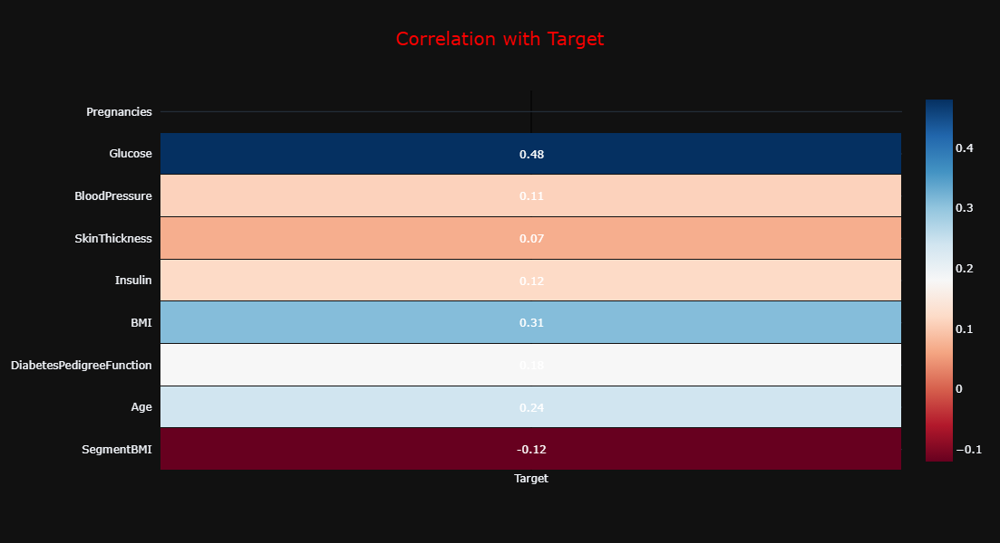

In [58]:
mask = np.triu(np.ones_like(target_corr, dtype=bool))
df_mask = target_corr.mask(mask)
df_mask_rounded = df_mask.round(2)
fig = ff.create_annotated_heatmap(
    z=df_mask_rounded.values,
    x=['Target'],
    y=df_mask_rounded.index.tolist(),
    colorscale='RdBu',
    hoverinfo='none',
    showscale=True,
    ygap=1,
    xgap=1
)
fig.update_xaxes(side='bottom')
fig.update_layout(
    title_text='Correlation with Target',
    title_font=dict(size=20, color='red'),
    title_x=0.5,
    width=1000,
    height=600,
    xaxis=dict(showgrid=True),
    yaxis=dict(showgrid=True, autorange='reversed'),
    template='plotly_dark'
)
for annotation in fig.layout.annotations:
    if annotation.text == 'nan':
        annotation.text = ""

fig.show()

<Axes: >

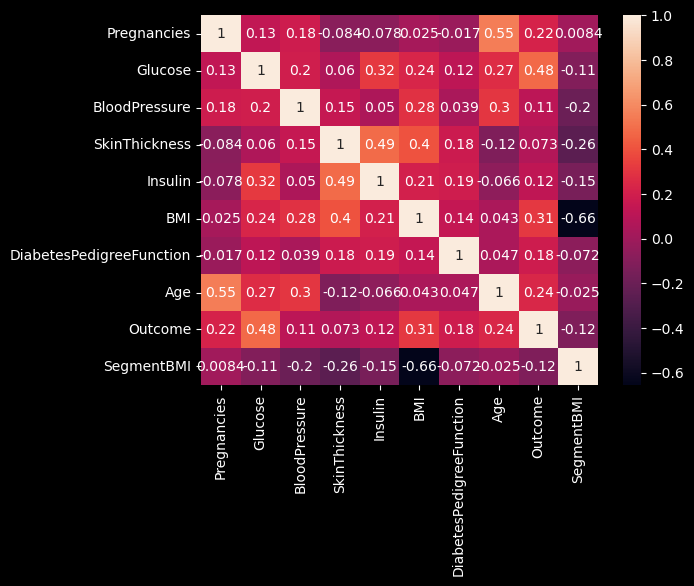

In [59]:
matrix=data.corr()
sns.heatmap(matrix,annot=True)

In [60]:
### Split 
X = data.drop(['SegmentBMI','Outcome'],axis=1)
y = data['Outcome']
keys = X.columns
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6.0,148.0,72,35,0.0,33.6,0.627,50.0
1,1.0,85.0,66,29,0.0,26.6,0.351,31.0
2,8.0,183.0,64,0,0.0,23.3,0.672,32.0
3,1.0,89.0,66,23,94.0,28.1,0.167,21.0
4,0.0,137.0,40,35,168.0,43.1,1.200,33.0


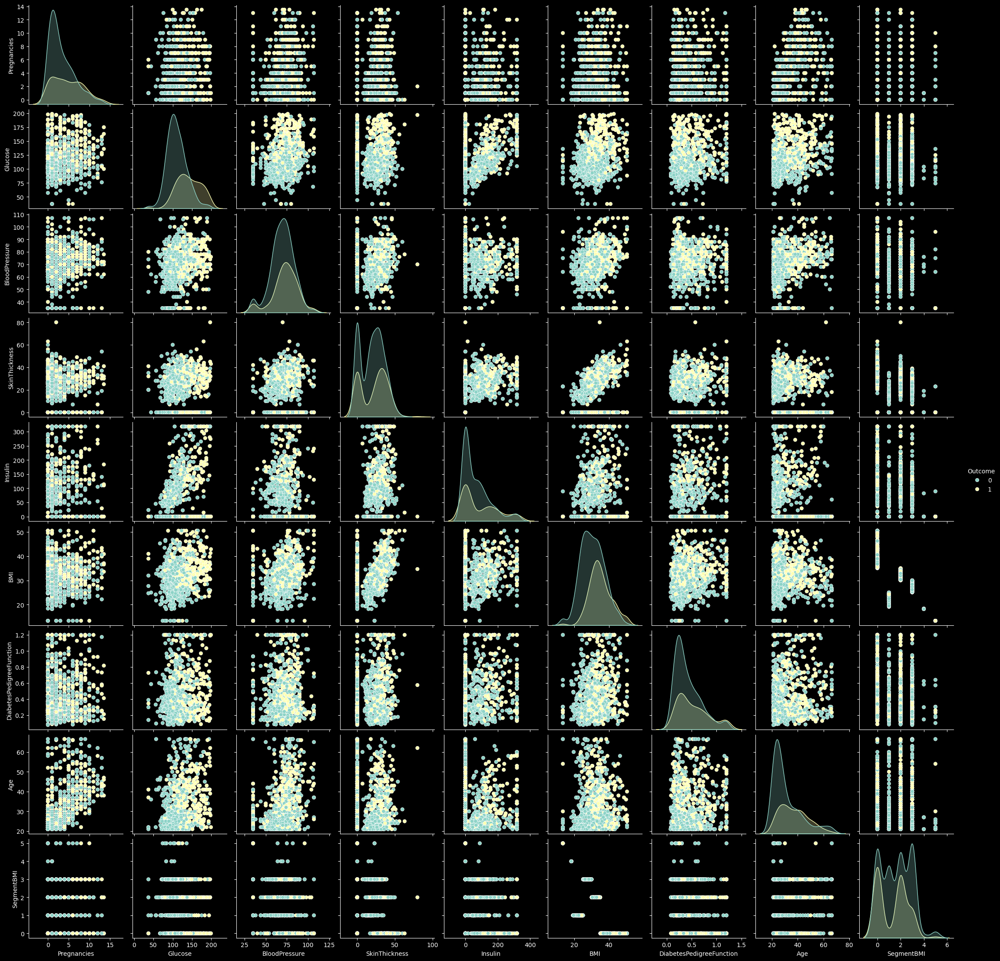

In [63]:
sns.pairplot(data,hue='Outcome')

In [64]:
y.head()

0    1
1    0
2    1
3    0
4    1
Name: Outcome, dtype: int64

In [65]:
data.head(5)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,SegmentBMI
0,6.0,148.0,72,35,0.0,33.6,0.627,50.0,1,2
1,1.0,85.0,66,29,0.0,26.6,0.351,31.0,0,3
2,8.0,183.0,64,0,0.0,23.3,0.672,32.0,1,1
3,1.0,89.0,66,23,94.0,28.1,0.167,21.0,0,3
4,0.0,137.0,40,35,168.0,43.1,1.200,33.0,1,0


In [66]:
### Scaling
scale = MinMaxScaler()
X = scale.fit_transform(X)
X = pd.DataFrame(X,columns=keys)
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.444444,0.684942,0.513889,0.4375,0.000000,0.544355,0.489305,0.637363
1,0.074074,0.295753,0.430556,0.3625,0.000000,0.356183,0.243316,0.219780
2,0.592593,0.901158,0.402778,0.0000,0.000000,0.267473,0.529412,0.241758
3,0.074074,0.320463,0.430556,0.2875,0.295481,0.396505,0.079323,0.000000
4,0.000000,0.616988,0.069444,0.4375,0.528094,0.799731,1.000000,0.263736


In [67]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20,
                                            random_state=42, shuffle =True,stratify=y)
print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)

X_train shape is  (614, 8)
X_test shape is  (154, 8)
y_train shape is  (614,)
y_test shape is  (154,)


In [68]:
# Apply SMOTEN to the training data
smoten = SMOTEENN(random_state=42)
X_resampled, y_resampled = smoten.fit_resample(X, y)
# Print the shapes after applying SMOTEN
print('X_resampled shape is ', X_resampled.shape)
print('y_resampled shape is ', y_resampled.shape)

X_resampled shape is  (556, 8)
y_resampled shape is  (556,)


In [69]:
X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled = train_test_split(X_resampled, y_resampled,
                                                                           test_size=0.20,random_state=42, shuffle =True,stratify=y_resampled)
print('X_train_resampled shape is ' , X_train_resampled.shape)
print('X_test_resampled shape is ' , X_test_resampled.shape)
print('y_train_resampled shape is ' , y_train_resampled.shape)
print('y_test_resampled shape is ' , y_test_resampled.shape)

X_train_resampled shape is  (444, 8)
X_test_resampled shape is  (112, 8)
y_train_resampled shape is  (444,)
y_test_resampled shape is  (112,)


In [70]:
models = {
    'RandomForest': RandomForestClassifier(random_state=42),
    'XGBoost': XGBClassifier(),
    'LGBM': LGBMClassifier(verbose=-1),
    'DecisionTree': DecisionTreeClassifier(random_state=42),
    'KNN': KNeighborsClassifier(),
    'SVC': SVC(probability=True,random_state=42, class_weight='balanced'),
    'LogisticRegression': LogisticRegression(random_state=42, class_weight='balanced'),
    'CatBoost': CatBoostClassifier(logging_level='Silent'),
    'GradientBoosting': GradientBoostingClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'NaiveBayes': GaussianNB()
}
### Validation Score
cv_results = {}
for model_name, model in models.items():
    print(f"Cross-validating {model_name}...")
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1,verbose=0)
    cv_results[model_name] = cv_scores.mean()
    print(f"Mean accuracy for {model_name}: {cv_scores.mean():.4f}")

Cross-validating RandomForest...
Mean accuracy for RandomForest: 0.7688
Cross-validating XGBoost...
Mean accuracy for XGBoost: 0.7264
Cross-validating LGBM...
Mean accuracy for LGBM: 0.7280
Cross-validating DecisionTree...
Mean accuracy for DecisionTree: 0.6760
Cross-validating KNN...
Mean accuracy for KNN: 0.7102
Cross-validating SVC...
Mean accuracy for SVC: 0.7558
Cross-validating LogisticRegression...
Mean accuracy for LogisticRegression: 0.7443
Cross-validating CatBoost...
Mean accuracy for CatBoost: 0.7671
Cross-validating GradientBoosting...
Mean accuracy for GradientBoosting: 0.7493
Cross-validating AdaBoost...
Mean accuracy for AdaBoost: 0.7622
Cross-validating NaiveBayes...
Mean accuracy for NaiveBayes: 0.7590


In [71]:
cv_results_df = pd.DataFrame(list(cv_results.items()), columns=['Model', 'Mean Accuracy'])
cv_results_df = cv_results_df.sort_values(by='Mean Accuracy', ascending=False)
cv_results_df

,Model,Mean Accuracy
0,RandomForest,0.768786
7,CatBoost,0.767133
9,AdaBoost,0.762202
10,NaiveBayes,0.758976
5,SVC,0.755778
8,GradientBoosting,0.749274
6,LogisticRegression,0.744329
2,LGBM,0.728029
1,XGBoost,0.726376
4,KNN,0.710169


In [72]:
best_model_name = cv_results_df.iloc[0]['Model']
print(f"\nBest model from CV: {best_model_name}")


Best model from CV: RandomForest


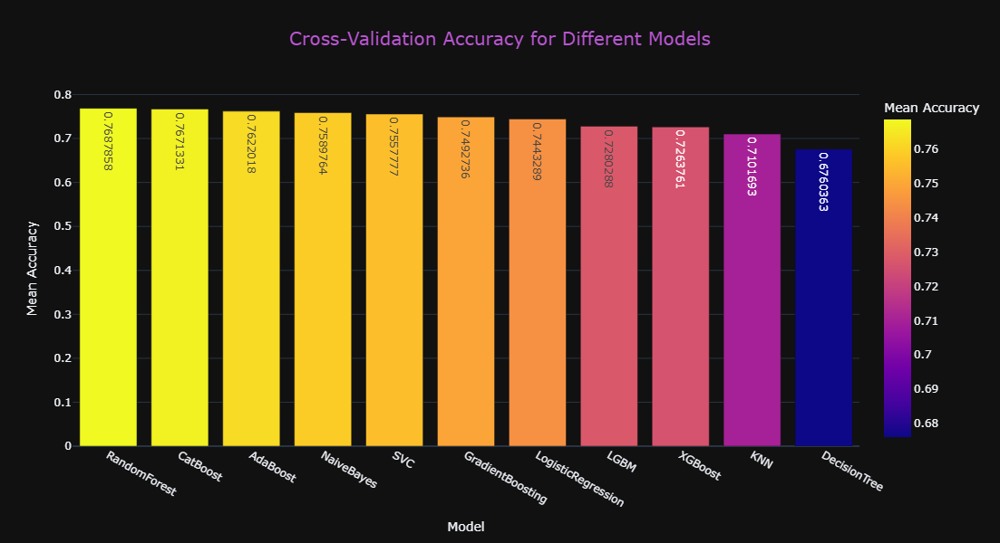

In [73]:
fig = px.bar(cv_results_df, x='Model', y='Mean Accuracy', title='Cross-Validation Accuracy for Different Models',text_auto=True,
             labels={'Mean Accuracy': 'Mean Accuracy'}, color='Mean Accuracy')
fig.update_layout(
    title_x=0.5,
    title_font=dict(size=20, color='mediumorchid'),
    template="plotly_dark",  
    width=800,              
    height=600 
)
fig.show()

In [ ]:
param_grids = {
    'RandomForest': {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5, 10]
    },
    'XGBoost': {
        'max_depth': [3, 5, 7, 10, 20, 30, 40],
        'n_estimators': [50, 100, 200],
        'subsample': [0.6, 0.8, 1],
        'learning_rate': [0.05, 0.1, 0.5,1]
    },
    'LGBM': {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 5, 10, 20, 30, 40],
        'learning_rate': [0.05, 0.1, 0.5,1]
    },
    'DecisionTree': {
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5, 10]
    },
    'KNN': {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance']
    },
    'SVC': {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf', 'poly'],
        'gamma': ['scale', 'auto']
    },
    'LogisticRegression': {
        'C': [0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'saga']
    },
    'CatBoost': {
        'iterations': [100, 200],
        'learning_rate': [0.05, 0.1,.5,1],
        'depth': [6, 10, 15, 20, 25, 30, 40]
    },
    'GradientBoosting': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.05, 0.1,.5,1],
        'max_depth': [None, 10, 20, 30, 40]
    },
    'AdaBoost': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.05, 0.1,.5,1]
    },
    'NaiveBayes': {}
}

best_results = []
for model_name, model in models.items():
    print(f"\nPerforming GridSearchCV for {model_name}...")
    grid_search = GridSearchCV(estimator=model, param_grid=param_grids[model_name], cv=5, scoring='accuracy', verbose=0, n_jobs=-1)
    grid_search.fit(X_train, y_train)
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_results.append({'Model': model_name, 'Best Score': best_score, 'Best Params': best_params})
    print(f"\nBest parameters for {model_name}: {best_params}")
    print(f"Best cross-validation score for {model_name}: {best_score:.4f}")

In [75]:
best_results_df = pd.DataFrame(best_results)
best_results_df = best_results_df.sort_values(by='Best Score', ascending=False)
best_results_df

,Model,Best Score,Best Params
5,SVC,0.786685,"{'C': 1, 'gamma': 'scale', 'kernel': 'poly'}"
0,RandomForest,0.785059,"{'max_depth': 10, 'min_samples_split': 2, 'n_e..."
1,XGBoost,0.783407,"{'learning_rate': 0.05, 'max_depth': 3, 'n_est..."
7,CatBoost,0.776903,"{'depth': 6, 'iterations': 100, 'learning_rate..."
2,LGBM,0.768799,"{'learning_rate': 0.05, 'max_depth': 5, 'n_est..."
6,LogisticRegression,0.750846,"{'C': 10, 'penalty': 'l1', 'solver': 'saga'}"
4,KNN,0.739531,"{'n_neighbors': 7, 'weights': 'uniform'}"
3,DecisionTree,0.676036,"{'max_depth': None, 'min_samples_split': 2}"


In [76]:
best_model_name, best_model_param = best_results_df.iloc[0]['Model'],best_results_df.iloc[0]['Best Params']
print(f"\nBest model : {best_model_name}")
print(f"\nBest Parameters : {best_model_param}")


Best model : SVC

Best Parameters : {'C': 1, 'gamma': 'scale', 'kernel': 'poly'}


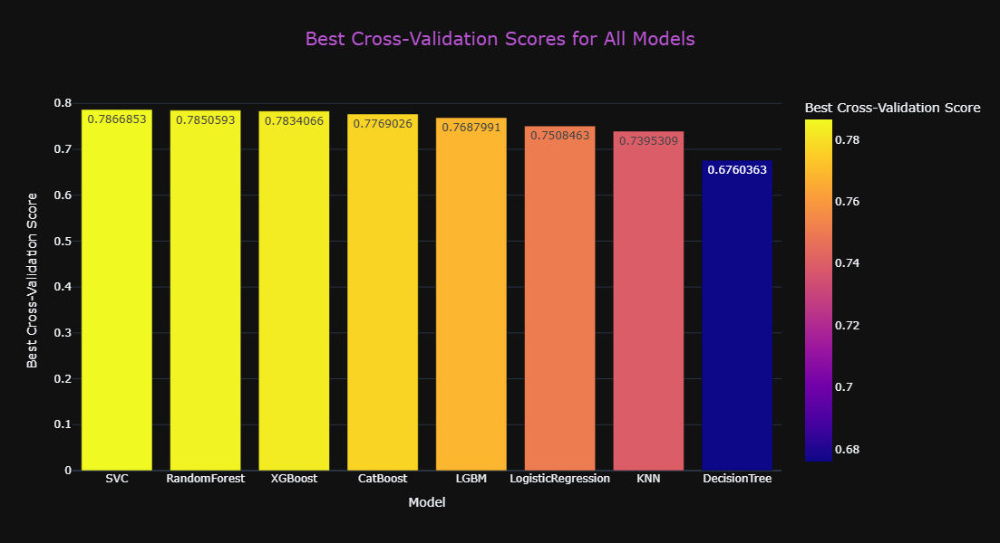

In [77]:
fig = px.bar(best_results_df, x='Model', y='Best Score',title='Best Cross-Validation Scores for All Models',text_auto=True,
             labels={'Best Score': 'Best Cross-Validation Score'}, color='Best Score')
fig.update_layout(
    title_x=0.5,
    title_font=dict(size=20, color='mediumorchid'),
    template="plotly_dark",  
    width=800,              
    height=600 
)
fig.show()

In [78]:
################# Best Model Train 
model = SVC(probability=True,random_state=42, class_weight='balanced',C=1,gamma='scale',kernel='poly')
model.fit(X_train, y_train)

SVC(C=1, class_weight='balanced', kernel='poly', probability=True,
    random_state=42)

In [79]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import joblib  # to save the model

# Predictions on train and test data
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Calculate metrics for training set
train_accuracy = accuracy_score(y_train, y_train_pred)
train_precision = precision_score(y_train, y_train_pred, average='weighted')  
train_recall = recall_score(y_train, y_train_pred, average='weighted')  
train_f1 = f1_score(y_train, y_train_pred, average='weighted')  

# Calculate metrics for test set
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred, average='weighted') 
test_recall = recall_score(y_test, y_test_pred, average='weighted')  
test_f1 = f1_score(y_test, y_test_pred, average='weighted') 

# Print evaluation metrics
print(f'Training Accuracy: {train_accuracy:.2f}')
print(f'Training Precision: {train_precision:.2f}')
print(f'Training Recall: {train_recall:.2f}')
print(f'Training F1-Score: {train_f1:.2f}')
print('---')
print(f'Test Accuracy: {test_accuracy:.2f}')
print(f'Test Precision: {test_precision:.2f}')
print(f'Test Recall: {test_recall:.2f}')
print(f'Test F1-Score: {test_f1:.2f}')

# Save the model
joblib.dump(model, 'model/model_name.joblib')
print("Model saved successfully in the model folder.")


Training Accuracy: 0.84
Training Precision: 0.84
Training Recall: 0.84
Training F1-Score: 0.84
---
Test Accuracy: 0.71
Test Precision: 0.71
Test Recall: 0.71
Test F1-Score: 0.71


FileNotFoundError: [Errno 2] No such file or directory: 'model/model_name.joblib'

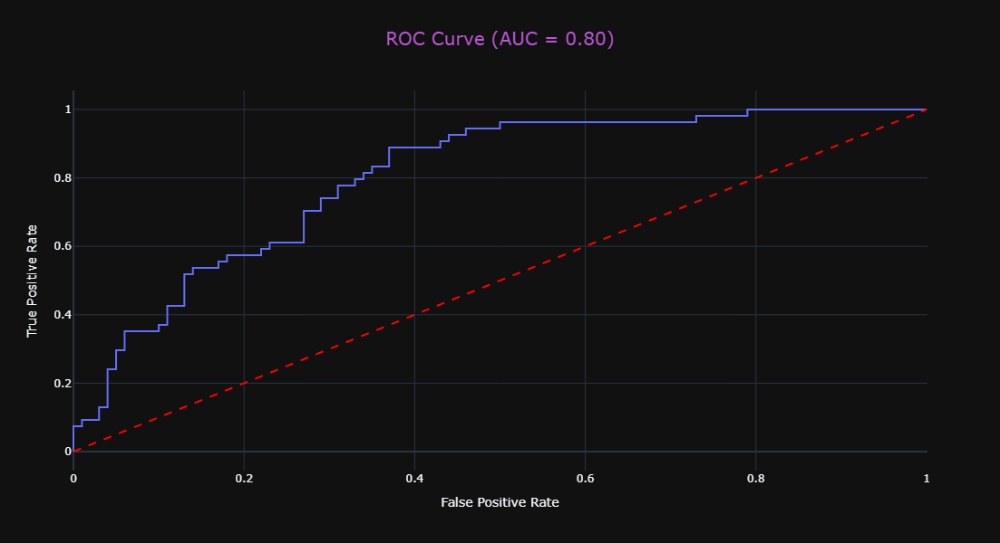

In [80]:
# AUC and ROC curve for test set
y_test_prob = model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)
roc_auc = roc_auc_score(y_test, y_test_prob)
roc_data = {
    'False Positive Rate': fpr,
    'True Positive Rate': tpr
}
fig = px.line(
    roc_data, 
    x='False Positive Rate', 
    y='True Positive Rate',
    title=f'ROC Curve (AUC = {roc_auc:.2f})',
    labels={'x': 'False Positive Rate', 'y': 'True Positive Rate'},
    width=800,
    height=600
)
fig.add_shape(
    type='line', 
    x0=0, y0=0, x1=1, y1=1,
    line=dict(color='red', dash='dash')
)
fig.update_layout(
    title_font=dict(size=20, color='mediumorchid'),
    title_x=0.5,
    xaxis=dict(showgrid=True, zeroline=True),
    yaxis=dict(showgrid=True, zeroline=True),
    template='plotly_dark'
)
fig.show()


Confusion Matrix is : 
 [[78 22]
 [22 32]]


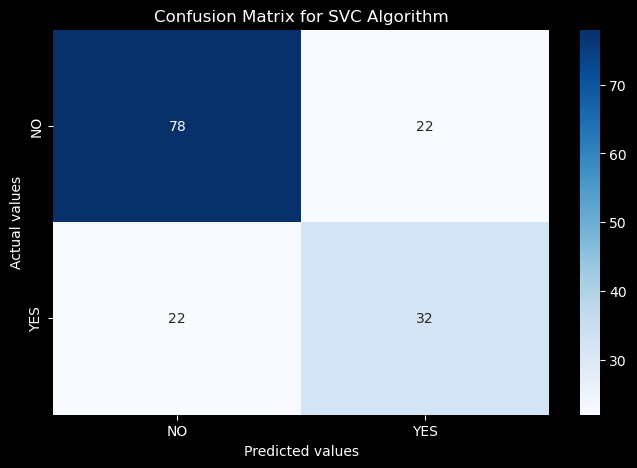

In [81]:
### Check model
CM = confusion_matrix(y_test, y_test_pred)
print('Confusion Matrix is : \n', CM)
plt.figure(figsize=(8,5))
sns.heatmap(data=CM, annot=True,fmt='g', cmap="Blues", xticklabels=['NO', 'YES'], yticklabels=['NO', 'YES'])
plt.xlabel('Predicted values')
plt.ylabel('Actual values')
plt.title(f'Confusion Matrix for {best_model_name} Algorithm')
plt.show()

In [82]:
ClassificationReport = classification_report(y_test,y_test_pred,target_names=['NO', 'YES'])
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

          NO       0.78      0.78      0.78       100
         YES       0.59      0.59      0.59        54

    accuracy                           0.71       154
   macro avg       0.69      0.69      0.69       154
weighted avg       0.71      0.71      0.71       154



In [83]:
# Apply ML in SMOTEN to the training data
### Validation Score 
cv_results = {}
for model_name, model in models.items():
    print(f"Cross-validating {model_name}...")
    cv_scores = cross_val_score(model, X_train_resampled, y_train_resampled, cv=5, scoring='accuracy', n_jobs=-1,verbose=0)
    cv_results[model_name] = cv_scores.mean()
    print(f"Mean accuracy for {model_name}: {cv_scores.mean():.4f}")

Cross-validating RandomForest...
Mean accuracy for RandomForest: 0.9504
Cross-validating XGBoost...
Mean accuracy for XGBoost: 0.9595
Cross-validating LGBM...
Mean accuracy for LGBM: 0.9572
Cross-validating DecisionTree...
Mean accuracy for DecisionTree: 0.9121
Cross-validating KNN...
Mean accuracy for KNN: 0.9280
Cross-validating SVC...
Mean accuracy for SVC: 0.9437
Cross-validating LogisticRegression...
Mean accuracy for LogisticRegression: 0.9144
Cross-validating CatBoost...
Mean accuracy for CatBoost: 0.9572
Cross-validating GradientBoosting...
Mean accuracy for GradientBoosting: 0.9459
Cross-validating AdaBoost...
Mean accuracy for AdaBoost: 0.9257
Cross-validating NaiveBayes...
Mean accuracy for NaiveBayes: 0.8852


In [84]:
cv_results_df = pd.DataFrame(list(cv_results.items()), columns=['Model', 'Mean Accuracy'])
cv_results_df = cv_results_df.sort_values(by='Mean Accuracy', ascending=False)
cv_results_df

,Model,Mean Accuracy
1,XGBoost,0.959474
7,CatBoost,0.957201
2,LGBM,0.957201
0,RandomForest,0.950434
8,GradientBoosting,0.945940
5,SVC,0.943693
4,KNN,0.927962
9,AdaBoost,0.925664
6,LogisticRegression,0.914428
3,DecisionTree,0.912104


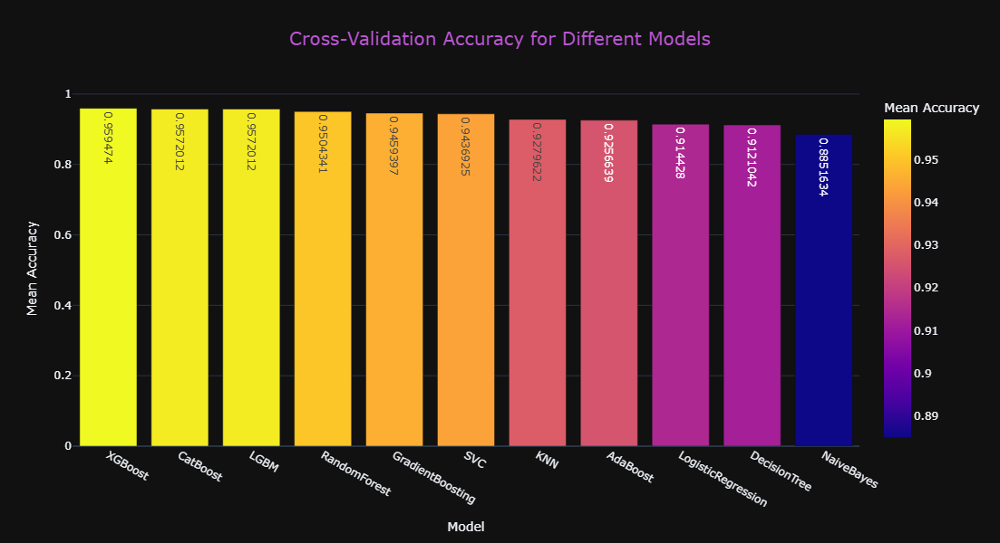

In [85]:
fig = px.bar(cv_results_df, x='Model', y='Mean Accuracy', title='Cross-Validation Accuracy for Different Models',text_auto=True,
             labels={'Mean Accuracy': 'Mean Accuracy'}, color='Mean Accuracy')
fig.update_layout(
    title_x=0.5,
    title_font=dict(size=20, color='mediumorchid'),
    template="plotly_dark",  
    width=800,              
    height=600 
)
fig.show()

In [86]:
best_results = []
for model_name, model in models.items():
    print(f"\nPerforming GridSearchCV for {model_name}...")
    grid_search = GridSearchCV(estimator=model, param_grid=param_grids[model_name], cv=5, scoring='accuracy', verbose=0, n_jobs=-1)
    grid_search.fit(X_train_resampled, y_train_resampled)
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    # Store the best score and parameters
    best_results.append({'Model': model_name, 'Best Score': best_score, 'Best Params': best_params})
    print(f"\nBest parameters for {model_name}: {best_params}")
    print(f"Best cross-validation score for {model_name}: {best_score:.4f}")


Performing GridSearchCV for RandomForest...

Best parameters for RandomForest: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 50}
Best cross-validation score for RandomForest: 0.9572

Performing GridSearchCV for XGBoost...

Best parameters for XGBoost: {'learning_rate': 0.5, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1}
Best cross-validation score for XGBoost: 0.9662

Performing GridSearchCV for LGBM...

Best parameters for LGBM: {'learning_rate': 0.5, 'max_depth': None, 'n_estimators': 50}
Best cross-validation score for LGBM: 0.9640

Performing GridSearchCV for DecisionTree...

Best parameters for DecisionTree: {'max_depth': None, 'min_samples_split': 5}
Best cross-validation score for DecisionTree: 0.9122

Performing GridSearchCV for KNN...

Best parameters for KNN: {'n_neighbors': 3, 'weights': 'distance'}
Best cross-validation score for KNN: 0.9459

Performing GridSearchCV for SVC...

Best parameters for SVC: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Best cr

In [91]:
import os
import joblib
from sklearn.model_selection import GridSearchCV

# Ensure the directory for saving models exists
if not os.path.exists("saved_models"):
    os.makedirs("saved_models")

for model_name, model in models.items():
    print(f"\nPerforming GridSearchCV for {model_name}...")
    
    # Perform GridSearchCV
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grids[model_name],
        cv=5,
        scoring='accuracy',
        verbose=0,
        n_jobs=-1
    )
    grid_search.fit(X_train_resampled, y_train_resampled)
    
    # Save the best model
    best_model_path = f"saved_models/{model_name}_best_model.joblib"
    joblib.dump(grid_search.best_estimator_, best_model_path)
    
    print(f"Saved {model_name} best model to {best_model_path}")



Performing GridSearchCV for RandomForest...
Saved RandomForest best model to saved_models/RandomForest_best_model.joblib

Performing GridSearchCV for XGBoost...
Saved XGBoost best model to saved_models/XGBoost_best_model.joblib

Performing GridSearchCV for LGBM...
Saved LGBM best model to saved_models/LGBM_best_model.joblib

Performing GridSearchCV for DecisionTree...
Saved DecisionTree best model to saved_models/DecisionTree_best_model.joblib

Performing GridSearchCV for KNN...
Saved KNN best model to saved_models/KNN_best_model.joblib

Performing GridSearchCV for SVC...
Saved SVC best model to saved_models/SVC_best_model.joblib

Performing GridSearchCV for LogisticRegression...
Saved LogisticRegression best model to saved_models/LogisticRegression_best_model.joblib

Performing GridSearchCV for CatBoost...
Saved CatBoost best model to saved_models/CatBoost_best_model.joblib

Performing GridSearchCV for GradientBoosting...
Saved GradientBoosting best model to saved_models/GradientBoos

In [92]:
pip install -r requirements.txt


In [93]:
from fastapi import FastAPI, HTTPException
from pydantic import BaseModel
import joblib
import numpy as np

# Load the model
try:
    model = joblib.load("model/RandomForest_best_model.joblib")
    print("Model loaded successfully.")
except Exception as e:
    print("Error loading model:", e)

# Initialize FastAPI app
app = FastAPI()

# Define the input data model
class InputData(BaseModel):
    Pregnancies: int
    Glucose: float
    BloodPressure: float
    SkinThickness: float
    Insulin: float
    BMI: float
    DiabetesPedigreeFunction: float
    Age: int
    SegmentBMI: str  # Assuming this is categorical

# Preprocess SegmentBMI feature
def preprocess_segment_bmi(segment: str):
    if segment == "Low":
        return [1, 0, 0]
    elif segment == "Medium":
        return [0, 1, 0]
    elif segment == "High":
        return [0, 0, 1]
    else:
        raise ValueError("Unknown SegmentBMI category")

# Define the prediction endpoint
@app.post("/predict")
async def predict(input_data: InputData):
    try:
        # Extract the input features from request data
        data = [
            input_data.Pregnancies,
            input_data.Glucose,
            input_data.BloodPressure,
            input_data.SkinThickness,
            input_data.Insulin,
            input_data.BMI,
            input_data.DiabetesPedigreeFunction,
            input_data.Age
        ]

        # Preprocess SegmentBMI
        segment_bmi_encoded = preprocess_segment_bmi(input_data.SegmentBMI)
        data.extend(segment_bmi_encoded)

        # Convert data to a NumPy array
        data_array = np.array(data).reshape(1, -1)

        # Predict using the model
        prediction = model.predict(data_array)
        return {"prediction": int(prediction[0])}
    except ValueError as e:
        raise HTTPException(status_code=400, detail=str(e))
    except Exception as e:
        raise HTTPException(status_code=500, detail="An error occurred during prediction.")

# Root endpoint for status check
@app.get("/")
async def root():
    return {"message": "Model API is up and running!"}


Model loaded successfully.


In [94]:

# Initialize FastAPI app
app = FastAPI()

# Define the input data model
class InputData(BaseModel):
    Pregnancies: int
    Glucose: float
    BloodPressure: float
    SkinThickness: float
    Insulin: float
    BMI: float
    DiabetesPedigreeFunction: float
    Age: int
    SegmentBMI: str  # Assuming this is categorical

# Preprocess SegmentBMI feature
def preprocess_segment_bmi(segment: str):
    if segment == "Low":
        return [1, 0, 0]
    elif segment == "Medium":
        return [0, 1, 0]
    elif segment == "High":
        return [0, 0, 1]
    else:
        raise ValueError("Unknown SegmentBMI category")


In [95]:

# Define the prediction endpoint
@app.post("/predict")
async def predict(input_data: InputData):
    try:
        # Extract the input features from request data
        data = [
            input_data.Pregnancies,
            input_data.Glucose,
            input_data.BloodPressure,
            input_data.SkinThickness,
            input_data.Insulin,
            input_data.BMI,
            input_data.DiabetesPedigreeFunction,
            input_data.Age
        ]

        # Preprocess SegmentBMI
        segment_bmi_encoded = preprocess_segment_bmi(input_data.SegmentBMI)
        data.extend(segment_bmi_encoded)

        # Convert data to a NumPy array
        data_array = np.array(data).reshape(1, -1)

        # Predict using the model
        prediction = model.predict(data_array)
        return {"prediction": int(prediction[0])}
    except ValueError as e:
        raise HTTPException(status_code=400, detail=str(e))
    except Exception as e:
        raise HTTPException(status_code=500, detail="An error occurred during prediction.")

In [96]:

# Root endpoint for status check
@app.get("/")
async def root():
    return {"message": "Model API is up and running!"}


In [ ]:
import nest_asyncio
import uvicorn
from fastapi import FastAPI, HTTPException
from pydantic import BaseModel
import joblib
import numpy as np


nest_asyncio.apply()


try:
    model = joblib.load("model/RandomForest_best_model.joblib")
    print("Model loaded successfully.")
except Exception as e:
    print("Error loading model:", e)

# Initialize FastAPI app
app = FastAPI()

# Define the input data model
class InputData(BaseModel):
    Pregnancies: int
    Glucose: float
    BloodPressure: float
    SkinThickness: float
    Insulin: float
    BMI: float
    DiabetesPedigreeFunction: float
    Age: int
    SegmentBMI: str  


def preprocess_segment_bmi(segment: str):
    if segment == "Low":
        return [1, 0, 0]
    elif segment == "Medium":
        return [0, 1, 0]
    elif segment == "High":
        return [0, 0, 1]
    else:
        raise ValueError("Unknown SegmentBMI category")


@app.post("/predict")
async def predict(input_data: InputData):
    try:
        # Extract the input features from request data
        data = [
            input_data.Pregnancies,
            input_data.Glucose,
            input_data.BloodPressure,
            input_data.SkinThickness,
            input_data.Insulin,
            input_data.BMI,
            input_data.DiabetesPedigreeFunction,
            input_data.Age
        ]

        # Preprocess SegmentBMI
        segment_bmi_encoded = preprocess_segment_bmi(input_data.SegmentBMI)
        data.extend(segment_bmi_encoded)

        # Convert data to a NumPy array
        data_array = np.array(data).reshape(1, -1)

        # Predict using the model
        prediction = model.predict(data_array)
        return {"prediction": int(prediction[0])}
    except ValueError as e:
        raise HTTPException(status_code=400, detail=str(e))
    except Exception as e:
        raise HTTPException(status_code=500, detail="An error occurred during prediction.")

# Root endpoint for status check
@app.get("/")
async def root():
    return {"message": "Model API is up and running!"}

# Run the FastAPI app in Jupyter Notebook
uvicorn.run(app, host="0.0.0.0", port=8000)


INFO:     Started server process [19656]


Model loaded successfully.


INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO:     127.0.0.1:55526 - "GET / HTTP/1.1" 200 OK
INFO:     127.0.0.1:55526 - "GET /favicon.ico HTTP/1.1" 404 Not Found
INFO:     127.0.0.1:55556 - "GET /docs HTTP/1.1" 200 OK
INFO:     127.0.0.1:55556 - "GET /openapi.json HTTP/1.1" 200 OK
INFO:     127.0.0.1:55610 - "POST /predict HTTP/1.1" 400 Bad Request
INFO:     127.0.0.1:55650 - "GET /predict HTTP/1.1" 405 Method Not Allowed
INFO:     127.0.0.1:60774 - "POST /predict HTTP/1.1" 422 Unprocessable Entity
